# Workflow implementation

### Load libraries

In this notebook we will use the following Python libraries:
- [os](https://docs.python.org/3/library/os.html) - To create directories and work with files
- [urllib](https://docs.python.org/3/library/urllib.html) - To access to online resources
- [pandas](https://pandas.pydata.org/docs/user_guide/index.html) - To create and manage data frames (tables) in Python
- [plotly](https://plotly.com/python/) - For dynamic and interactive plotting

In [89]:
# lOAD LIBRARIES
import os
import urllib
os.environ['USE_PYGEOS'] = '0'
import pandas as pd
import geopandas as gpd
import json
import plotly.express as px

# Function for loading spatial data
%run DROUGHTS_functions.ipynb


### Define working environment and global parameters
This workflow relies on pre-proceessed data. The user will define the path to the data folder and the code below would create a folder for outputs.


In [90]:
# Set working environment

workflow_folder = './risk_data_ES'


Load NUTS3 spatial data and define regions of interest

In [91]:
# load nuts3 spatial data
print('Load NUTS3 map')
json_nuts_path = 'https://gisco-services.ec.europa.eu/distribution/v2/nuts/geojson/NUTS_RG_01M_2021_4326_LEVL_3.geojson'
nuts = load_nuts_json(json_nuts_path)

Load NUTS3 map


## Select country codes

In [93]:
print("Choose country code from: ", nuts['CNTR_CODE'].unique())

Choose country code from:  ['HR' 'DE' 'BG' 'AT' 'AL' 'BE' 'ES' 'CH' 'CZ' 'EL' 'FR' 'FI' 'EE' 'DK'
 'CY' 'HU' 'NL' 'NO' 'LV' 'LT' 'IS' 'MK' 'MT' 'IT' 'TR' 'PL' 'RO' 'SE'
 'RS' 'PT' 'IE' 'UK' 'ME' 'LU' 'SK' 'SI' 'LI']


In [94]:
# set country code
ccode = "ES"

# validate country selection and subset regions
if not nuts['CNTR_CODE'].str.contains(ccode).any:
    print("Country code: ", ccode, " is not valid; please choose a valid country code.")
else:
    nuts = nuts.query('CNTR_CODE in @ccode')
  
    print("List of nuts2: ", nuts['NUTS_ID'].str.slice(0,4).unique())

regions = nuts['NUTS_ID']
    
# prepare output table
output = pd.DataFrame(regions, columns = ['NUTS_ID'])


List of nuts2:  ['ES51' 'ES53' 'ES43' 'ES52' 'ES61' 'ES70' 'ES42' 'ES24' 'ES12' 'ES41'
 'ES11' 'ES30' 'ES22' 'ES21' 'ES62' 'ES63' 'ES64' 'ES13' 'ES23']


## Loading drought risk data and concatenate historic risk and with future risk datasets
Drought risk data is provided in the format required at the NUTS3 level for EU countries in the sample_data folder: file "XX.csv". See XX for details the workflow for the drought risk assessment

In [96]:
# Load the CSV files into a DataFrame
data = ['historic',  'ssp126_ff', 'ssp126_ff',  'ssp370_nf', 'ssp370_ff']
# ,'ssp126_nf', 'ssp370_nf', 'ssp370_ff', 'ssp585_nf', 'ssp585_ff'
count = 0

for d in data:
    df = pd.read_csv(os.path.join(workflow_folder,  f"droughtrisk_{ccode}_{d}.csv"))
    # Print the first 5 rows of the DataFrame
    df['data']=f"{d}" #create a new column with the data specification
    if count == 0:
        df_ = df
        count = 1
    else:
        df_ = pd.concat([df_, df], axis=0) #concatenate the  data in a single dataframe

#print (df_.head(10))

#to save it 
#df_.to_csv('out.csv', index=False) 

In [95]:
# Load the CSV files into a DataFrame
data = ['historic',  'ssp126_ff', 'ssp126_ff',  'ssp370_nf', 'ssp370_ff']
# ,'ssp126_nf', 'ssp370_nf', 'ssp370_ff', 'ssp585_nf', 'ssp585_ff'
count = 0

for d in data:
    df = pd.read_csv(os.path.join(workflow_folder,  f"droughtrisk_{ccode}_{d}.csv"))
    # Print the first 5 rows of the DataFrame
    df['data']=f"{d}" #create a new column with the data specification
    if count == 0:
        df_ = df
        count = 1
    else:
        df_ = pd.concat([df_, df], axis=0) #concatenate the  data in a single dataframe

#print (df_.head(10))

#to save it 
#df_.to_csv('out.csv', index=False) 

### Plot risk map

Plot the risk category for NUTS3 regions on a map of a selected country. This map allows to compare the drought risk category between NUTS3 regions within a selected country. It also allows to see how the relative drought risk category of NUTS3 regions changes in relation to each other in the different datasets (e.g. historical, ssp126 near future, ssp126 far future, etc.).

__NOTE: The risk category for each region is always relative to the other regions considered in the workflow (here: country level) and therefore not directly comparable between datasets. This means that the risk category of one region may be higher or lower compared to the other regions, but not between e.g. historical vs. future datasets. Please refer to the risk assessment workflow for more details on how drought risk is calculated.__



Map comparing risk category (relative risk category from low = 1 to high =5) at NUTS3 level for all units in a given country, in historical and future datasets:
Move the cursor over the regions to see their details. Change dataset (e.g. historical, ssp126 near future, ssp126 far future etc.) using the animation frame at the bottom.
Please see note above about the comparability of risk category between different datasets (i.e. not possible as drought risk is always relative to the other regions)


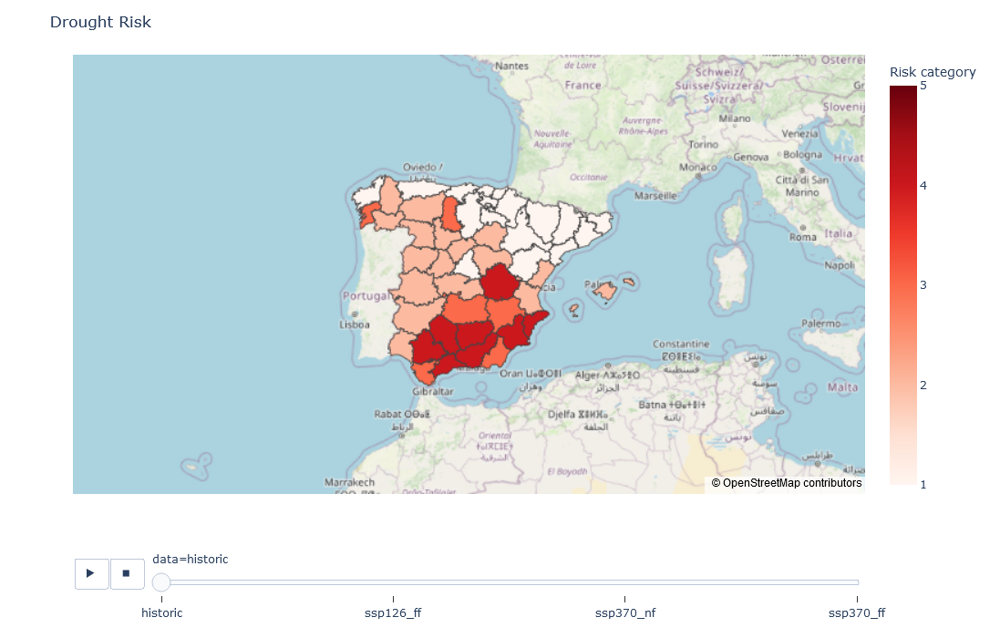

In [98]:
print('\n')
print('Map comparing risk category (relative risk category from low = 1 to high =5) at NUTS3 level for all units in a given country, in historical and future datasets:')
print('Move the cursor over the regions to see their details. Change dataset (e.g. historical, ssp126 near future, ssp126 far future etc.) using the animation frame at the bottom.')
print('Please see note above about the comparability of risk category between different datasets (i.e. not possible as drought risk is always relative to the other regions)')

x_nuts, y_nuts = gpd.GeoSeries(nuts.geometry).unary_union.centroid.xy

fig = px.choropleth_mapbox(df_, geojson=nuts.geometry, locations='Location', color='risk_cat',\
                  animation_frame = 'data', color_continuous_scale="reds", range_color = [1,5], mapbox_style="open-street-map")


fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(title="Drought Risk",
                  mapbox_center = {"lat": list(y_nuts)[0], "lon": list(x_nuts)[0]},
                  mapbox_zoom=4,
                  height=700,
                 coloraxis_colorbar=dict(
                    title= "Risk category",
                    tickvals = [1, 2, 3, 4, 5],
                    ticktext = [1, 2, 3, 4, 5]
                 ))

fig.show()
print('\n')

#### Plot risk histogram
Compare the relative drought risk of a focal area (NUTS2 region) at NUTS3 level in a given country.


Select NUTS2 (focal area)

In [104]:
#create a group column for the NUTS2 regions
df_['NUTS2'] = df_['NUTS_ID'].str.slice(0,4)

#create another column with True if the region is within the focal area and False if it is not
df_['focal_area']=df_['NUTS2'] =='ES51'


           Location NUTS_ID  hazard_raw  exposure_raw  vulnerability_raw  \
0        ES: Girona   ES512       0.773         0.520              0.272   
1      ES: Mallorca   ES532       0.776         1.000              0.420   
2       ES: Menorca   ES533       0.761         1.000              0.492   
3     ES: Barcelona   ES511       0.770         1.000              0.254   
4       ES: Badajoz   ES431       0.733         0.488              1.000   
..              ...     ...         ...           ...                ...   
45     ES: Albacete   ES421       0.794         0.936              0.010   
46  ES: Guadalajara   ES424       0.822         0.727              0.778   
47       ES: Teruel   ES242       0.789         0.414              0.160   
48  ES: Ciudad Real   ES422       0.797         0.639              0.210   
49      ES: Segovia   ES416       0.833         0.880              0.743   

    risk_raw  risk_cat       data NUTS2  focal_area  
0      0.109         1   historic



Histogram of risk_raw (relative risk between 0 -1) at NUTS3 level for all units in a given country. Selected NUTS2 (focal area) is colored blue:


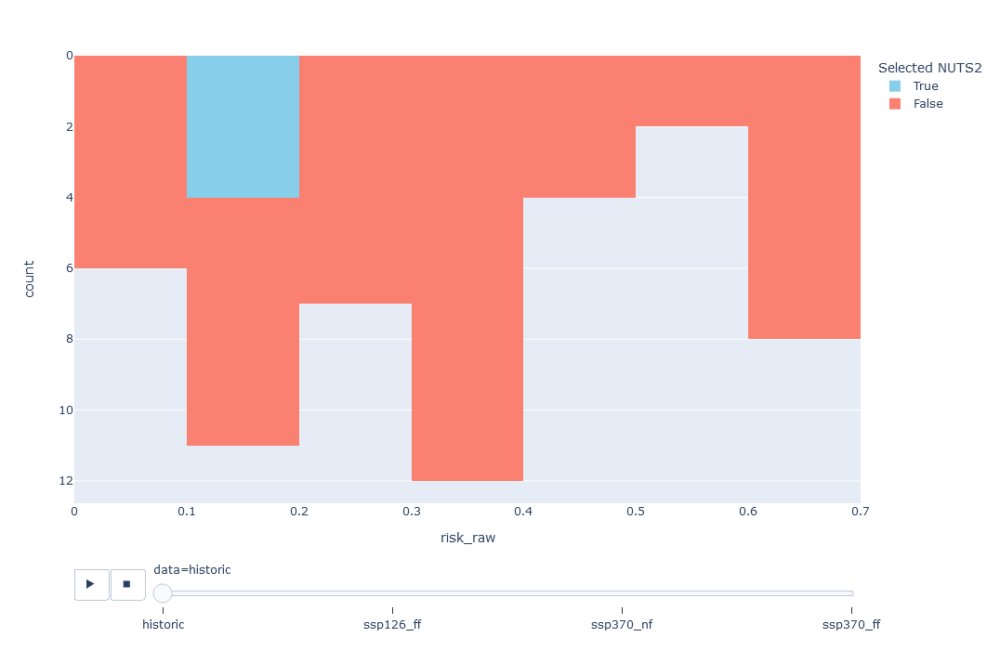

In [109]:
print('\n')
print('Histogram of risk_raw (relative risk between 0 -1) at NUTS3 level for all units in a given country. Selected NUTS2 (focal area) is colored blue:')


fig2 = px.histogram(df_, x='risk_raw',\
                     color='focal_area',\
                     color_discrete_map={True:'skyblue', False: 'salmon'},
                    animation_frame = 'data'
                       )
fig2.update_layout(
legend = dict(title = "Selected NUTS2"),
height = 700)


fig2.show()

print('\n')

#output.to_csv(os.path.join(workflow_folder, 'outputs', 'droughtrisk_' + ccode + '.csv'))

#### Plot ranking for NUTS3 within a selected NUTS2

In [108]:
print('\n')
print('Ranking of risk_raw (relative risk between 0 -1) at NUTS3 level within a selected NUTS2:')

# Create an empty list to store results
rnking_list = []

# Loop through unique values in x['run']
for sim in df_['data'].unique():
    # Filter rows where 'run' is equal to sim
    tmp = df_[df_['data'] == sim]  
 # Sort tmp by 'risk_raw' in descending order
    tmp = tmp.sort_values(by='risk_raw', ascending=False)
    
    # Filter rows where 'NUTS2' is "EL61", select 'Location' and 'NUTS_ID'
    tmp_out = tmp[tmp['NUTS2'] == "ES51"][['Location', 'NUTS_ID']]
    
    # Create a 'rank' column with the ranking of rows where 'NUTS2' is "EL61"
    tmp_out['rank'] = tmp_out.index + 1
    
    # Add 'run' column with sim value
    tmp_out['data'] = sim
 
   # Append tmp_out to rnking_list
    rnking_list.append(tmp_out)

# Concatenate the list of DataFrames into a single DataFrame
rnking = pd.concat(rnking_list)

# Spread the 'run' values into columns, using 'rank' as values
result = rnking.pivot(index='Location', columns='data', values='rank')
print (result)

print('\n') 



Ranking of risk_raw (relative risk between 0 -1) at NUTS3 level within a selected NUTS2:


ValueError: Index contains duplicate entries, cannot reshape

#### Plot line chart
Compare historic and future drought risk of NUTS3 regions (relaive risk between o and 1) within a selected NUTS2 focal area



Line chart for historic and future relative drought risk of NUTS3 regions


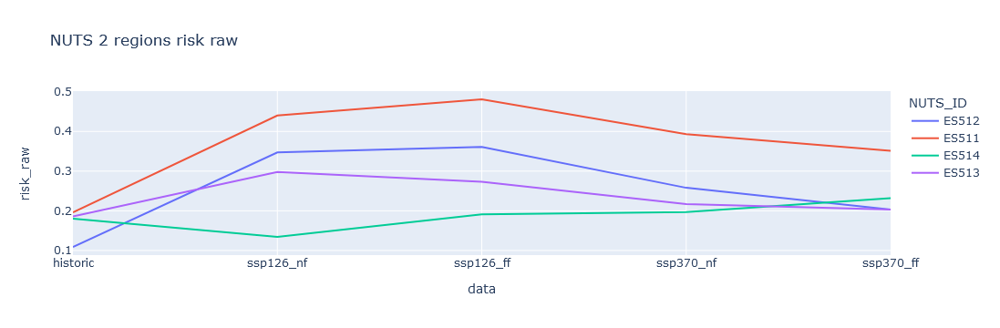

In [86]:
print('\n')
print('Line chart for historic and future relative drought risk in the focal area (NUTS2)')

fig3 = px.line(df_[df_['NUTS2'] == "ES51"][['NUTS_ID', 'data', 'risk_raw']], x="data", y="risk_raw", color='NUTS_ID', title='NUTS3 regions risk raw')
fig3.show()

print('\n')